# Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Import Data

In [2]:
# option to show all columns
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('train.csv')

In [4]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

In [5]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

# Feature Selection

In [6]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [7]:
# I dropped Id
numerical_features = ['LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'
]

# I dropped Alley, PoolQC, MiscFeature
categorical_features = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'Fence',
       'SaleType', 'SaleCondition'
]

target = 'SalePrice'

In [8]:
df[categorical_features] = df[categorical_features].astype('category')

# Train Test Split

In [9]:
X = df[numerical_features+categorical_features]
y = df[target]

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

# Outlier Removal

In [11]:
# for now I won't remove outliers

# Numerical Transformers

In [12]:
numeric_transformer = Pipeline(steps=[
    ('mean_imputer', SimpleImputer(strategy='median')),  # Impute with median
    ('scaler', StandardScaler())  # Scale with StandardScaler
])

# Categorical Transformers

In [13]:
def label_encode(X):
    encoder = LabelEncoder()
    
    X_df = pd.DataFrame(X)
    
    return X_df.apply(lambda col: LabelEncoder().fit_transform(col))

In [14]:
categorical_transformer = Pipeline(steps=[
    ('constant_imputer', SimpleImputer(strategy='constant', fill_value='NA')),  # Impute with NA value instead of leaving null
    ('label_encoder', FunctionTransformer(label_encode, validate=False))  # label encoding due to dimensionality issues
])

# Preprocessing Pipeline

In [15]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num_transformer', numeric_transformer, numerical_features),
        ('cat_transformer', categorical_transformer, categorical_features),
    ])

# Modeling Functions

In [16]:
def show_results(y_test, y_pred):
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return {'mae': mae, 'mse': mse, 'rmse': rmse, 'mape': mape, 'r2': r2}

In [17]:
def get_output_df(X_test, y_pred, y_test):
    df_compare = X_test.copy()
    
    df_compare['pred'] = y_pred
    df_compare['target'] = y_test.values

    df_compare['absolute_error'] = (df_compare['pred'] - df_compare['target']).abs()
    
    return df_compare

In [18]:
# function to plot the feature importances of tree based algorithms
def show_feature_importances(model, encoding='none'):
    feature_importances = model.named_steps['regressor'].feature_importances_
    
    feature_names = []
    if encoding in ['none', 'one-hot']:
        feature_names = model.named_steps['preprocessor'].get_feature_names_out()
    else:
        # these features must be defined globally in the notebook
        feature_names = numerical_features+categorical_features
    
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print(importance_df)
    
    # Plotting the horizontal bar chart
    plt.figure(figsize=(10, 8))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importances')
    plt.gca().invert_yaxis()  # To display the most important feature at the top
    plt.tight_layout()

In [19]:
# Variable that stores the test scores of the different models to decide which one to use
report_ac = {}

# Modeling Parametrizations

In [20]:
metric_to_optimize = 'neg_mean_squared_error'

In [21]:
param_grid_lr = {
    # Linear Regression has no hyperparameters
}

param_grid_ridge = {
    'regressor__alpha': [0.01, 0.1, 1, 10, 100]
}

param_grid_lasso = {
    'regressor__alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10]
}

param_grid_elastic_net = {
    'regressor__alpha': [0.01, 0.1, 1, 10],
    'regressor__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
}

param_grid_svr = {
    'regressor__C': [0.1, 1, 10],
    'regressor__epsilon': [0.01, 0.1, 0.5],
    'regressor__kernel': ['linear', 'rbf']
}

param_grid_knn = {
    'regressor__n_neighbors': [3, 5, 7, 10],
    'regressor__weights': ['uniform', 'distance']
}

param_grid_mlp = {
    'regressor__hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'regressor__activation': ['relu', 'tanh'],
    'regressor__alpha': [0.0001, 0.001, 0.01],
    'regressor__learning_rate': ['constant', 'adaptive']
}

param_grid_rf = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [5, 10, 20],
    'regressor__min_samples_split': [2, 5]
}

param_grid_gb = {
    'regressor__n_estimators': [100, 200],
    'regressor__learning_rate': [0.05, 0.1, 0.2],
    'regressor__max_depth': [3, 5]
}

# Linear Regression

In [22]:
lr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

In [23]:
grid_search_lr = GridSearchCV(
    estimator=lr_model,
    param_grid=param_grid_lr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [24]:
grid_search_lr.fit(X_train, y_train)

lr_model = grid_search_lr.best_estimator_

y_pred_lr = lr_model.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [25]:
print("Best hyperparameters:", grid_search_lr.best_params_)

results = show_results(y_test, y_pred_lr)
print(results)

report_ac['lr'] = results

Best hyperparameters: {}
{'mae': 24930.084765192216, 'mse': 1109901430.4274719, 'rmse': 33315.18318165866, 'mape': 0.15501427025802392, 'r2': 0.8264959425007412}


In [26]:
# get_output_df(X_test, y_pred_lr, y_test)

# Ridge Regression

In [27]:
ridge_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

In [28]:
grid_search_ridge = GridSearchCV(
    estimator=ridge_model,
    param_grid=param_grid_ridge,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [29]:
grid_search_ridge.fit(X_train, y_train)

ridge_model = grid_search_ridge.best_estimator_

y_pred_ridge = ridge_model.predict(X_test)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


In [30]:
print("Best hyperparameters:", grid_search_ridge.best_params_)

results = show_results(y_test, y_pred_ridge)
print(results)

report_ac['ridge'] = results

Best hyperparameters: {'regressor__alpha': 100}
{'mae': 21695.607388074906, 'mse': 929188721.2842256, 'rmse': 30482.59702328897, 'mape': 0.12824983113169794, 'r2': 0.8547456477614693}


# Lasso Regression

In [31]:
lasso_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Lasso())
])

In [32]:
grid_search_lasso = GridSearchCV(
    estimator=lasso_model,
    param_grid=param_grid_lasso,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [33]:
grid_search_lasso.fit(X_train, y_train)

lasso_model = grid_search_lasso.best_estimator_

y_pred_lasso = lasso_model.predict(X_test)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


In [34]:
print("Best hyperparameters:", grid_search_lasso.best_params_)

results = show_results(y_test, y_pred_lasso)
print(results)

report_ac['lasso'] = results

Best hyperparameters: {'regressor__alpha': 10}
{'mae': 24599.59329167099, 'mse': 1090663119.3307717, 'rmse': 33025.189164193616, 'mape': 0.15239253827098645, 'r2': 0.8295033492336299}


# Elastic Net

In [35]:
elastic_net_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', ElasticNet())
])

In [36]:
grid_search_elastic_net = GridSearchCV(
    estimator=elastic_net_model,
    param_grid=param_grid_elastic_net,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [37]:
grid_search_elastic_net.fit(X_train, y_train)

elastic_net_model = grid_search_elastic_net.best_estimator_

y_pred_elastic_net = elastic_net_model.predict(X_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [38]:
print("Best hyperparameters:", grid_search_elastic_net.best_params_)

results = show_results(y_test, y_pred_elastic_net)
print(results)

report_ac['elastic_net'] = results

Best hyperparameters: {'regressor__alpha': 1, 'regressor__l1_ratio': 0.3}
{'mae': 21265.789388479683, 'mse': 996391888.6373893, 'rmse': 31565.67579883867, 'mape': 0.12194316342474215, 'r2': 0.8442401903461338}


# SVR

In [39]:
svr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', SVR())
])

In [40]:
grid_search_svr = GridSearchCV(
    estimator=svr_model,
    param_grid=param_grid_svr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [41]:
grid_search_svr.fit(X_train, y_train)

svr_model = grid_search_svr.best_estimator_

y_pred_svr = svr_model.predict(X_test)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [42]:
print("Best hyperparameters:", grid_search_svr.best_params_)

results = show_results(y_test, y_pred_svr)
print(results)

report_ac['svr'] = results

Best hyperparameters: {'regressor__C': 10, 'regressor__epsilon': 0.01, 'regressor__kernel': 'linear'}
{'mae': 26390.379964760174, 'mse': 1924695672.483735, 'rmse': 43871.35366595992, 'mape': 0.13784490143011147, 'r2': 0.6991241749291406}


# KNN Regressor

In [43]:
knn_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor())
])

In [44]:
grid_search_knn = GridSearchCV(
    estimator=knn_model,
    param_grid=param_grid_knn,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [45]:
grid_search_knn.fit(X_train, y_train)

knn_model = grid_search_knn.best_estimator_

y_pred_knn = knn_model.predict(X_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [46]:
print("Best hyperparameters:", grid_search_knn.best_params_)

results = show_results(y_test, y_pred_knn)
print(results)

report_ac['knn'] = results

Best hyperparameters: {'regressor__n_neighbors': 5, 'regressor__weights': 'distance'}
{'mae': 26943.037633515574, 'mse': 1567355351.7635996, 'rmse': 39589.838996434424, 'mape': 0.15879164703529275, 'r2': 0.754984987297993}


# MLP Regressor

In [47]:
mlp_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', MLPRegressor())
])

In [48]:
grid_search_mlp = GridSearchCV(
    estimator=mlp_model,
    param_grid=param_grid_mlp,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [49]:
grid_search_mlp.fit(X_train, y_train)

mlp_model = grid_search_mlp.best_estimator_

y_pred_mlp = mlp_model.predict(X_test)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [50]:
print("Best hyperparameters:", grid_search_mlp.best_params_)

results = show_results(y_test, y_pred_mlp)
print(results)

report_ac['mlp'] = results

Best hyperparameters: {'regressor__activation': 'relu', 'regressor__alpha': 0.01, 'regressor__hidden_layer_sizes': (100, 50), 'regressor__learning_rate': 'constant'}
{'mae': 36084.14918798784, 'mse': 3029120584.9536495, 'rmse': 55037.44711515651, 'mape': 0.1847138263972199, 'r2': 0.526476227765948}


# Random Forest Regressor

In [51]:
rf_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor())
])

In [52]:
grid_search_rf = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid_rf,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [53]:
grid_search_rf.fit(X_train, y_train)

rf_model = grid_search_rf.best_estimator_

y_pred_rf = rf_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [54]:
print("Best hyperparameters:", grid_search_rf.best_params_)

results = show_results(y_test, y_pred_rf)
print(results)

report_ac['rf'] = results

Best hyperparameters: {'regressor__max_depth': 10, 'regressor__min_samples_split': 2, 'regressor__n_estimators': 100}
{'mae': 19128.701179350646, 'mse': 852957185.5652337, 'rmse': 29205.43075465989, 'mape': 0.11053776632706415, 'r2': 0.8666624544201927}


         Feature  Importance
2    OverallQual    0.594941
14     GrLivArea    0.100072
12      2ndFlrSF    0.048235
10   TotalBsmtSF    0.031524
1        LotArea    0.024945
..           ...         ...
32       MiscVal    0.000069
16  BsmtHalfBath    0.000055
45    Condition2    0.000025
37        Street    0.000003
40     Utilities    0.000000

[76 rows x 2 columns]


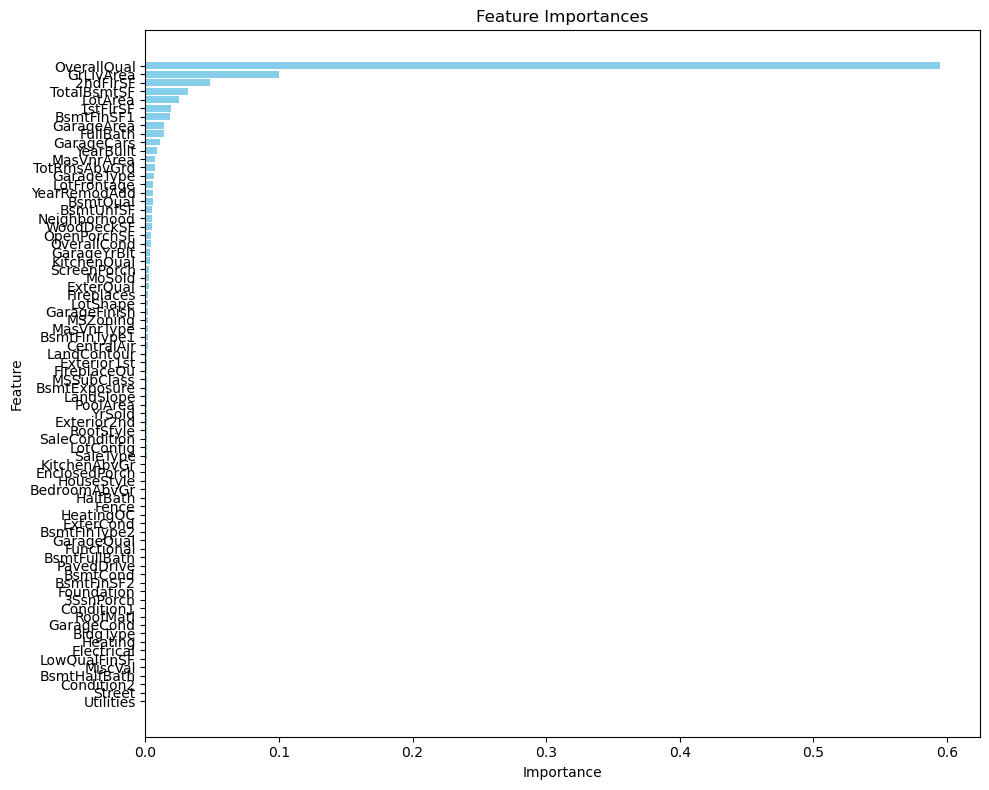

In [55]:
show_feature_importances(rf_model, 'label')

# Gradient Booster Regressor

In [56]:
gb_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor())
])

In [57]:
grid_search_gb = GridSearchCV(
    estimator=gb_model,
    param_grid=param_grid_gb,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [58]:
grid_search_gb.fit(X_train, y_train)

gb_model = grid_search_gb.best_estimator_

y_pred_gb = gb_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [59]:
print("Best hyperparameters:", grid_search_gb.best_params_)

results = show_results(y_test, y_pred_gb)
print(results)

report_ac['gb'] = results

Best hyperparameters: {'regressor__learning_rate': 0.1, 'regressor__max_depth': 5, 'regressor__n_estimators': 100}
{'mae': 17976.7319053169, 'mse': 772520217.316269, 'rmse': 27794.247917802506, 'mape': 0.09842178980825655, 'r2': 0.8792366704555385}


In [60]:
pd.set_option('display.max_rows', None)

get_output_df(X_test, y_pred_gb, y_test).sort_values(by=['absolute_error'], ascending=False)

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition,pred,target,absolute_error
688,60.0,8089,8,6,2007,2007,0.0,945,0,474,1419,1419,0,0,1419,1,0,2,0,2,1,7,1,2007.0,2,567,140,0,0,0,0,0,0,10,2007,20,RL,Pave,Reg,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,New,Partial,219956.309018,392000,172043.690982
898,100.0,12919,9,5,2009,2010,760.0,2188,0,142,2330,2364,0,0,2364,1,0,2,1,2,1,11,2,2009.0,3,820,0,67,0,0,0,0,0,3,2010,20,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,Stone,Ex,TA,PConc,Ex,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,New,Partial,461268.625184,611657,150388.374816
112,77.0,9965,7,5,2007,2007,220.0,984,0,280,1264,1282,1414,0,2696,1,0,2,1,4,1,10,1,2007.0,3,792,120,184,0,0,168,0,0,10,2007,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Gd,BuiltIn,Fin,TA,TA,Y,NaN,New,Partial,292917.127421,383970,91052.872579
1373,NaN,11400,10,5,2001,2002,705.0,1282,0,1351,2633,2633,0,0,2633,1,0,2,1,2,1,8,2,2001.0,3,804,314,140,0,0,0,0,0,3,2007,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,BrkFace,Ex,TA,PConc,Ex,TA,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,WD,Normal,377016.671167,466500,89483.328833
678,80.0,11844,8,5,2008,2008,464.0,0,0,2046,2046,2046,0,0,2046,0,0,2,1,3,1,7,1,2008.0,3,834,322,82,0,0,0,0,0,7,2009,20,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,1Story,Hip,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Mn,Unf,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,New,Partial,285813.782900,372500,86686.217100
261,69.0,9588,8,5,2007,2007,270.0,0,0,1482,1482,1482,1092,0,2574,0,0,2,1,3,1,10,1,2007.0,3,868,0,148,0,0,0,0,0,11,2007,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,CemntBd,CmentBd,Stone,Gd,TA,PConc,Ex,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Gd,BuiltIn,Fin,TA,TA,Y,NaN,New,Partial,359253.345939,276000,83253.345939
1243,107.0,13891,10,5,2006,2006,0.0,1386,0,690,2076,2076,0,0,2076,1,0,2,1,2,1,7,1,2006.0,3,850,216,229,0,0,0,0,0,9,2006,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,Unf,GasA,Ex,Y,SBrkr,Ex,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,New,Partial,382139.361178,465000,82860.638822
218,NaN,15660,7,9,1939,2006,312.0,341,0,457,798,1137,817,0,1954,0,1,1,1,3,1,8,2,1939.0,2,431,0,119,150,0,0,0,0,5,2008,50,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,Gd,CBlock,TA,TA,No,BLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,232581.160783,311500,78918.839217
970,60.0,10800,4,4,1949,1950,0.0,0,0,720,720,720,472,0,1192,0,0,1,1,4,1,6,0,NaN,0,0,0,0,0,0,0,0,0,12,2006,50,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,AsbShng,AsbShng,NaN,TA,TA,CBlock,TA,TA,No,Unf,Unf,GasA,TA,N,FuseA,TA,Typ,NaN,NaN,NaN,NaN,NaN,Y,NaN,WD,Abnorml,60538.771383,135000,74461.228617
1211,152.0,12134,8,7,1988,2005,0.0,427,0,132,559,1080,672,0,17

          Feature    Importance
2     OverallQual  5.720193e-01
14      GrLivArea  9.701246e-02
12       2ndFlrSF  5.538448e-02
10    TotalBsmtSF  2.945658e-02
11       1stFlrSF  2.472136e-02
1         LotArea  2.377803e-02
7      BsmtFinSF1  2.289981e-02
21   TotRmsAbvGrd  2.114187e-02
24     GarageCars  1.359115e-02
25     GarageArea  1.273595e-02
4       YearBuilt  1.088633e-02
56       BsmtQual  8.863029e-03
53      ExterQual  8.714789e-03
17       FullBath  7.139575e-03
65    KitchenQual  6.919798e-03
3     OverallCond  6.745610e-03
26     WoodDeckSF  5.924097e-03
22     Fireplaces  5.695307e-03
68     GarageType  5.329594e-03
5    YearRemodAdd  5.129841e-03
43   Neighborhood  4.940311e-03
9       BsmtUnfSF  4.790959e-03
0     LotFrontage  4.319157e-03
75  SaleCondition  4.159185e-03
30    ScreenPorch  3.654534e-03
27    OpenPorchSF  3.546981e-03
36       MSZoning  2.648121e-03
42      LandSlope  2.402375e-03
6      MasVnrArea  2.340021e-03
38       LotShape  2.245505e-03
59   Bsm

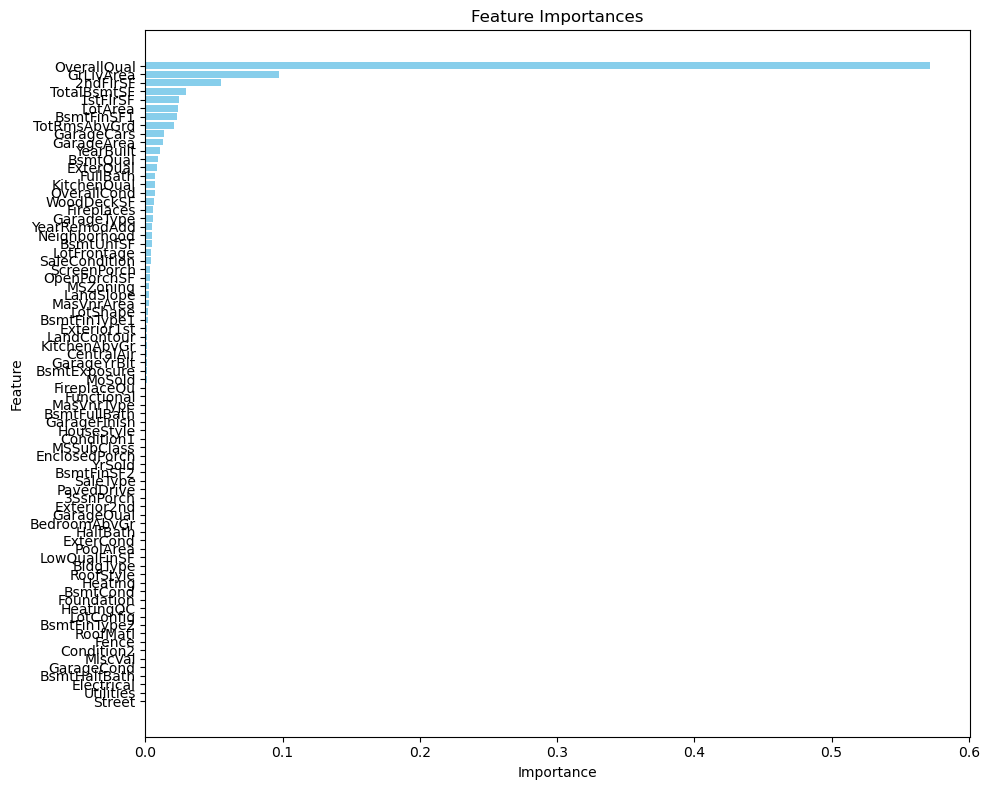

In [61]:
show_feature_importances(gb_model, 'label')

# Model Evaluation

In [62]:
report_ac

{'lr': {'mae': 24930.084765192216,
  'mse': 1109901430.4274719,
  'rmse': 33315.18318165866,
  'mape': 0.15501427025802392,
  'r2': 0.8264959425007412},
 'ridge': {'mae': 21695.607388074906,
  'mse': 929188721.2842256,
  'rmse': 30482.59702328897,
  'mape': 0.12824983113169794,
  'r2': 0.8547456477614693},
 'lasso': {'mae': 24599.59329167099,
  'mse': 1090663119.3307717,
  'rmse': 33025.189164193616,
  'mape': 0.15239253827098645,
  'r2': 0.8295033492336299},
 'elastic_net': {'mae': 21265.789388479683,
  'mse': 996391888.6373893,
  'rmse': 31565.67579883867,
  'mape': 0.12194316342474215,
  'r2': 0.8442401903461338},
 'svr': {'mae': 26390.379964760174,
  'mse': 1924695672.483735,
  'rmse': 43871.35366595992,
  'mape': 0.13784490143011147,
  'r2': 0.6991241749291406},
 'knn': {'mae': 26943.037633515574,
  'mse': 1567355351.7635996,
  'rmse': 39589.838996434424,
  'mape': 0.15879164703529275,
  'r2': 0.754984987297993},
 'mlp': {'mae': 36084.14918798784,
  'mse': 3029120584.9536495,
  'r

# Testing against the real test set

In [63]:
df = pd.read_csv('test.csv')

In [64]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,GasA,Gd,Y,SBrkr,763,892,0,1655,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,Y,157,84,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,GasA,Gd,Y,SBrkr,789,676,0,1465,0.0,0.0,2,1,3,1,TA,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,393.0,TA,TA,Y,0,75,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,7,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,GasA,Gd,Y,SBrkr,1341,0,0,1341,1.0,0.0,1,1,2,1,Gd,5,Typ,1,Po,Attchd,1990.0,Unf,2.0,506.0,TA,TA,Y,192,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,Plywood

In [65]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

In [66]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [67]:
numerical_features = ['LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'
]

# I dropped Alley, PoolQC, MiscFeature
categorical_features = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'Fence',
       'SaleType', 'SaleCondition'
]

target = 'SalePrice'

In [68]:
df[categorical_features] = df[categorical_features].astype('category')

In [69]:
X = df[numerical_features + categorical_features].copy()

In [70]:
df_compare = X.copy()
df_compare['pred'] = gb_model.predict(X)
df_compare

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition,pred
0,80.0,11622,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896,0,0,896,0.0,0.0,1,0,2,1,5,0,1961.0,1.0,730.0,140,0,0,0,120,0,0,6,2010,20,RH,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,MnPrv,WD,Normal,127579.513348
1,81.0,14267,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329,0,0,1329,0.0,0.0,1,1,3,1,6,0,1958.0,1.0,312.0,393,36,0,0,0,0,12500,6,2010,20,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,162871.175289
2,74.0,13830,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928,701,0,1629,0.0,0.0,2,1,3,1,6,1,1997.0,2.0,482.0,212,34,0,0,0,0,0,3,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,MnPrv,WD,Normal,173744.368363
3,78.0,9978,6,6,1998,1998,20.0,602.0,0.0,324.0,926.0,926,678,0,1604,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,470.0,360,36,0,0,0,0,0,6,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,183078.048327
4,43.0,5005,8,5,1992,1992,0.0,263.0,0.0,1017.0,1280.0,1280,0,0,1280,0.0,0.0,2,0,2,1,5,0,1992.0,2.0,506.0,0,82,0,0,144,0,0,1,2010,120,RL,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,WD,Normal,196159.377312
5,75.0,10000,6,5,1993,1994,0.0,0.0,0.0,763.0,763.0,763,892,0,1655,0.0,0.0,2,1,3,1,7,1,1993.0,2.0,440.0,157,84,0,0,0,0,0,4,2010,60,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,168621.027348
6,NaN,7980,6,7,1992,2007,0.0,935.0,0.0,233.0,1168.0,1187,0,0,1187,1.0,0.0,2,0,3,1,6,0,1992.0,2.0,420.0,483,21,0,0,0,0,500,3,2010,20,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,Gd,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Fin,TA,TA,Y,GdPrv,WD,Normal,172184.672993
7,63.0,8402,6,5,1998,1998,0.0,0.0,0.0,789.0,789.0,789,676,0,1465,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,393.0,0,75,0,0,0,0,0,5,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,163216.387383
8,85.0,10176,7,5,1990,1990,0.0,637.0,0.0,663.0,1300.0,1341,0,0,1341,1.0,0.0,1,1,2,1,5,1,1990.0,2.0,506.0,192,0,0,0,0,0,0,2,2010,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,Gd,GLQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Po,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,176803.500019
9,70.0,8400,4,5,1970,1970,0.0,804.0,78.0,0.0,882.0,882,0,0,882,1.0,0.0,1,0,2,1,4,0,1970.0,2.0,525.0,240,0,0,0,0,0,0,4,2010,20,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,No

# Notes

In [ ]:
'rf': {'mae': 19128.701179350646,
  'mse': 852957185.5652337,
  'rmse': 29205.43075465989,
  'mape': 0.11053776632706415,
  'r2': 0.8666624544201927},
 'gb': {'mae': 17976.7319053169,
  'mse': 772520217.316269,
  'rmse': 27794.247917802506,
  'mape': 0.09842178980825655,
  'r2': 0.8792366704555385}}

For this approach I used the majority of the features even those that may not be of interest. I only removed features that have no regression value (Id) and the ones with only missing values (Alley, PoolQC, MiscFeature)

The results were quite decent for this 1st approach with the best models being: 

    - Random Forest Regressor with R2=0.867, MAE=19218.70 and RMSE=29205.43

    - Gradient Boost Regressor with R2=0.879, MAE=17976.73 and RMSE=27794.25

In the next approach I will use only features with reported importance from the RF and GB. I will select the union of the top25 features from both models:
'Neighborhood','GarageCars','Fireplaces','GarageArea','YearRemodAdd','BsmtQual','BsmtUnfSF','LotArea','BsmtFinSF1','TotalBsmtSF','ScreenPorch','KitchenQual','OverallQual','WoodDeckSF','MasVnrArea','SaleCondition','OpenPorchSF','LotFrontage','GrLivArea','1stFlrSF','YearBuilt','OverallCond','GarageType','FullBath','2ndFlrSF','TotRmsAbvGrd','GarageYrBlt','ExterQual'


In [97]:
list(set(['OverallQual','GrLivArea','2ndFlrSF','TotalBsmtSF','LotArea','1stFlrSF','BsmtFinSF1','GarageArea','FullBath','GarageCars','YearBuilt','MasVnrArea','TotRmsAbvGrd','GarageType','LotFrontage','YearRemodAdd','BsmtQual','BsmtUnfSF','Neighborhood', 'WoodDeckSF','OpenPorchSF', 'OverallCond', 'GarageYrBlt', 'KitchenQual', 'ScreenPorch']) | set(['OverallQual','GrLivArea','2ndFlrSF','TotalBsmtSF','1stFlrSF','LotArea','BsmtFinSF1','TotRmsAbvGrd','GarageCars','GarageArea','YearBuilt','BsmtQual','ExterQual','FullBath','KitchenQual','OverallCond','WoodDeckSF','Fireplaces','GarageType','YearRemodAdd','Neighborhood','BsmtUnfSF','LotFrontage','SaleCondition', 'ScreenPorch']))

['Neighborhood',
 'GarageCars',
 'Fireplaces',
 'GarageArea',
 'YearRemodAdd',
 'BsmtQual',
 'BsmtUnfSF',
 'LotArea',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'ScreenPorch',
 'KitchenQual',
 'OverallQual',
 'WoodDeckSF',
 'MasVnrArea',
 'SaleCondition',
 'OpenPorchSF',
 'LotFrontage',
 'GrLivArea',
 '1stFlrSF',
 'YearBuilt',
 'OverallCond',
 'GarageType',
 'FullBath',
 '2ndFlrSF',
 'TotRmsAbvGrd',
 'GarageYrBlt',
 'ExterQual']

In [ ]:
['Neighborhood','GarageCars','Fireplaces','GarageArea','YearRemodAdd','BsmtQual','BsmtUnfSF','LotArea','BsmtFinSF1','TotalBsmtSF','ScreenPorch','KitchenQual','OverallQual','WoodDeckSF','MasVnrArea','SaleCondition','OpenPorchSF','LotFrontage','GrLivArea','1stFlrSF','YearBuilt','OverallCond','GarageType','FullBath','2ndFlrSF','TotRmsAbvGrd','GarageYrBlt','ExterQual']